# Import and installing

In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0,'/home/cane/Documents/yoseflab/can/resolVI')
from scvi.external import RESOLVI

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import anndata
import seaborn as sns
from scipy.sparse import csr_matrix as csr

2024-07-19 01:08:06.803352: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
sns.reset_orig()
sc.settings._vector_friendly = True
# p9.theme_set(p9.theme_classic)
plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.transparent"] = True
plt.rcParams["figure.figsize"] = (4, 4)

plt.rcParams["axes.titlesize"] = 15
plt.rcParams["axes.titleweight"] = 500
plt.rcParams["axes.titlepad"] = 8.0
plt.rcParams["axes.labelsize"] = 14
plt.rcParams["axes.labelweight"] = 500
plt.rcParams["axes.linewidth"] = 1.2
plt.rcParams["axes.labelpad"] = 6.0
plt.rcParams["axes.spines.top"] = False
plt.rcParams["axes.spines.right"] = False

plt.rcParams["font.size"] = 11
# plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica', "Computer Modern Sans Serif", "DejaVU Sans"]
plt.rcParams['font.weight'] = 500

plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['xtick.minor.size'] = 1.375
plt.rcParams['xtick.major.size'] = 2.75
plt.rcParams['xtick.major.pad'] = 2
plt.rcParams['xtick.minor.pad'] = 2

plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['ytick.minor.size'] = 1.375
plt.rcParams['ytick.major.size'] = 2.75
plt.rcParams['ytick.major.pad'] = 2
plt.rcParams['ytick.minor.pad'] = 2

plt.rcParams["legend.fontsize"] = 12
plt.rcParams['legend.handlelength'] = 1.4
plt.rcParams['legend.numpoints'] = 1
plt.rcParams['legend.scatterpoints'] = 3

plt.rcParams['lines.linewidth'] = 1.7
DPI = 300

In [4]:
import sys
sys.path.insert(0, '/home/cane/Documents/yoseflab/can/resolvi_eval_final2')

In [5]:
import _utils

## Load input data

### Original segmentation

In [7]:
folder = '/external_data/other/Vizgen_redownload'

In [8]:
patient1 = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cell_by_gene.csv', index_col=0)
patient1_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cell_metadata.csv', index_col=0)
patient2 = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cell_by_gene.csv', index_col=0)
patient2_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cell_metadata.csv', index_col=0)

In [9]:
vizgen1 = sc.AnnData(patient1)
vizgen1.obs = patient1_obs
vizgen1.obs_names = 'Patient1__' + vizgen1.obs_names.astype(str)
vizgen2 = sc.AnnData(patient2)
vizgen2.obs = patient2_obs
vizgen2.obs_names = 'Patient2__' + vizgen2.obs_names.astype(str)
vizgen = vizgen1.concatenate(vizgen2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)
vizgen

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [5731, 5734, 5735, 5736, 5737]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [24887, 24888, 24889, 24890, 24891]

    Inferred to be: in

AnnData object with n_obs × n_vars = 1166496 × 550
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'max_x', 'min_y', 'max_y', 'patient'

In [10]:
vizgen.obsm['spatial'] = vizgen.obsm['X_spatial'] =vizgen.obs[['center_x', 'center_y']].values

(array([8.43165e+05, 2.35343e+05, 6.42800e+04, 1.68840e+04, 4.81900e+03,
        1.43500e+03, 4.10000e+02, 1.20000e+02, 3.00000e+01, 8.00000e+00]),
 array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000.]),
 <BarContainer object of 10 artists>)

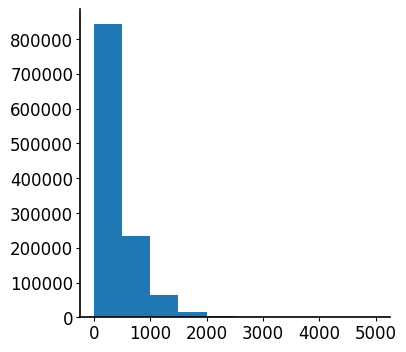

In [11]:
vizgen.obs['n_transcripts'] = vizgen.X.sum(1)
plt.hist(vizgen.obs['n_transcripts'], range=[0, 5000])

In [12]:
', '.join(vizgen.var_names)

'PDK4, CCL26, CX3CL1, PGLYRP1, CD4, SNAI2, TNFRSF17, ICAM3, TBX21, FAP, NFKB2, LAG3, TGFBR3, MMP11, XBP1, IL2RB, CTSG, GZMH, GZMB, NFKBIA, MMP2, CCL22, TSC2, TGFB1, CD79A, NKG7, HGF, SERPINE1, ACTA2, MPO, CSF3, WNT3, CCL2, CCL1, COL1A1, VTN, NFKB1, CCND1, IL23A, CDKN1B, IFNG, KLRB1, LOX, GZMK, IL12B, SELL, TGFB3, DUSP1, EGR1, KLRK1, TNFSF10, CXCR4, TWIST1, LRP1, SNAI1, CEACAM8, CDKN1A, SOX9, TNFSF9, CD70, FFAR2, CCR7, KLF2, SMO, RAF1, PLVAP, BST2, LGR6, CCNB1, PDGFRA, APC, TBX3, CDK4, IL6, BLK, FGFBP2, TLR2, MMP7, LYZ, LRP6, VWF, PROX1, CDH1, PDGFRB, FLT4, CREBBP, IL1B, BRD4, ELANE, EPCAM, AKT3, GNLY, KDR, PIK3CA, LAMC2, MCM6, FGF2, STAT3, ICAM1, PPARGC1A, CXCL9, MCM2, MSH3, EGF, STAP1, LAMP3, CDK6, PMS2, KLRG1, LGR5, CDK2, RB1, ITGAX, TP53, IFNAR1, FCGR2A, ACKR3, FABP2, SFRP2, GZMA, EGFR, DUSP6, TNFSF4, YAP1, ITGA1, WNT3A, FZD7, CSF1R, KIT, PREX2, SLC13A3, TNFRSF13C, CXCR5, CCR5, MAML1, ITGA5, CXCL16, LRP5, CXCR1, CXCL5, CCR1, CSF2, PLK1, STAT6, CD3D, CD14, MZB1, ITGB1, JUNB, CEBPB, F

In [13]:
vizgen.X = csr(vizgen.X)

In [14]:
vizgen.write_h5ad('vizgen_liver_cancer_original.h5ad')

### Postprocessing segmentation nucleus

In [15]:
folder = '/external_data/other/Vizgen_redownload'

In [16]:
patient1 = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_nuclei/cell_by_gene.csv', index_col=0)
patient1_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_nuclei/cell_metadata.csv', index_col=0)
patient2 = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_nuclei/cell_by_gene.csv', index_col=0)
patient2_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_nuclei/cell_metadata.csv', index_col=0)

In [17]:
vizgen1 = sc.AnnData(patient1)
vizgen1.obs = patient1_obs
vizgen1.obs_names = 'Patient1__' + vizgen1.obs_names.astype(str)
vizgen2 = sc.AnnData(patient2)
vizgen2.obs = patient2_obs
vizgen2.obs_names = 'Patient2__' + vizgen2.obs_names.astype(str)
vizgen = vizgen1.concatenate(vizgen2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)
vizgen

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [2565816200002100001, 2565816200002100002, 2565816200002100005, 2565816200002100006, 2565816200002100007]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [2557777400019100001, 2557777400019100002, 2557777400019100004, 2557777400019100006, 2557777400019100007]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/tmp/ipykernel_2524361/1579012239.py:7: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  vizgen = vizgen1.concatenate(vizgen2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)


AnnData object with n_obs × n_vars = 1027023 × 550
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'patient'

In [18]:
vizgen.obsm['spatial'] = vizgen.obsm['X_spatial'] =vizgen.obs[['center_x', 'center_y']].values

(array([9.49101e+05, 7.59000e+04, 1.92000e+03, 9.40000e+01, 8.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00]),
 array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000.]),
 <BarContainer object of 10 artists>)

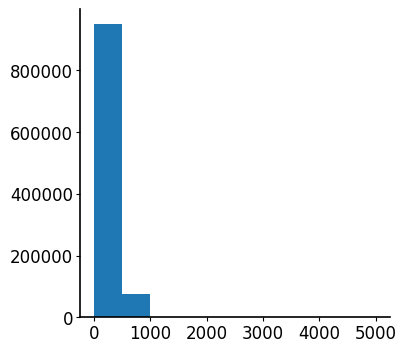

In [19]:
vizgen.obs['n_transcripts'] = vizgen.X.sum(1)
plt.hist(vizgen.obs['n_transcripts'], range=[0, 5000])

In [20]:
', '.join(vizgen.var_names)

'PDK4, CCL26, CX3CL1, PGLYRP1, CD4, SNAI2, TNFRSF17, ICAM3, TBX21, FAP, NFKB2, LAG3, TGFBR3, MMP11, XBP1, IL2RB, CTSG, GZMH, GZMB, NFKBIA, MMP2, CCL22, TSC2, TGFB1, CD79A, NKG7, HGF, SERPINE1, ACTA2, MPO, CSF3, WNT3, CCL2, CCL1, COL1A1, VTN, NFKB1, CCND1, IL23A, CDKN1B, IFNG, KLRB1, LOX, GZMK, IL12B, SELL, TGFB3, DUSP1, EGR1, KLRK1, TNFSF10, CXCR4, TWIST1, LRP1, SNAI1, CEACAM8, CDKN1A, SOX9, TNFSF9, CD70, FFAR2, CCR7, KLF2, SMO, RAF1, PLVAP, BST2, LGR6, CCNB1, PDGFRA, APC, TBX3, CDK4, IL6, BLK, FGFBP2, TLR2, MMP7, LYZ, LRP6, VWF, PROX1, CDH1, PDGFRB, FLT4, CREBBP, IL1B, BRD4, ELANE, EPCAM, AKT3, GNLY, KDR, PIK3CA, LAMC2, MCM6, FGF2, STAT3, ICAM1, PPARGC1A, CXCL9, MCM2, MSH3, EGF, STAP1, LAMP3, CDK6, PMS2, KLRG1, LGR5, CDK2, RB1, ITGAX, TP53, IFNAR1, FCGR2A, ACKR3, FABP2, SFRP2, GZMA, EGFR, DUSP6, TNFSF4, YAP1, ITGA1, WNT3A, FZD7, CSF1R, KIT, PREX2, SLC13A3, TNFRSF13C, CXCR5, CCR5, MAML1, ITGA5, CXCL16, LRP5, CXCR1, CXCL5, CCR1, CSF2, PLK1, STAT6, CD3D, CD14, MZB1, ITGB1, JUNB, CEBPB, F

In [21]:
vizgen.X = csr(vizgen.X)

In [22]:
vizgen.write_h5ad('vizgen_liver_cancer_cellpose_nuclei.h5ad')

### Postprocessing cell segmentation single z layer

In [23]:
folder = '/external_data/other/Vizgen_redownload'

In [24]:
patient1 = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_single_zlayer/cell_by_gene.csv', index_col=0)
patient1_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_single_zlayer/cell_metadata.csv', index_col=0)
patient2 = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_single_zlayer/cell_by_gene.csv', index_col=0)
patient2_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_single_zlayer/cell_metadata.csv', index_col=0)

In [25]:
vizgen1 = sc.AnnData(patient1)
vizgen1.obs = patient1_obs
vizgen1.obs_names = 'Patient1__' + vizgen1.obs_names.astype(str)
vizgen2 = sc.AnnData(patient2)
vizgen2.obs = patient2_obs
vizgen2.obs_names = 'Patient2__' + vizgen2.obs_names.astype(str)
vizgen = vizgen1.concatenate(vizgen2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)
vizgen

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [2565844500002100003, 2565844500002100006, 2565844500002100007, 2565844500002100009, 2565844500002100010]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got v

AnnData object with n_obs × n_vars = 1003172 × 550
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'patient'

In [26]:
vizgen.obsm['spatial'] = vizgen.obsm['X_spatial'] =vizgen.obs[['center_x', 'center_y']].values

(array([7.27315e+05, 2.26293e+05, 4.15700e+04, 6.50600e+03, 1.20000e+03,
        2.43000e+02, 3.30000e+01, 1.00000e+01, 2.00000e+00, 0.00000e+00]),
 array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000.]),
 <BarContainer object of 10 artists>)

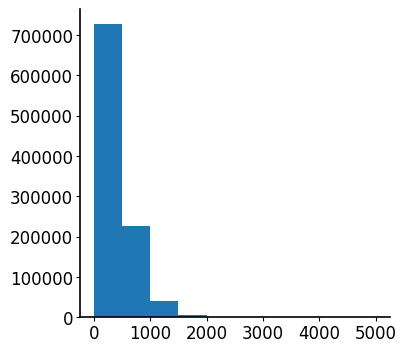

In [27]:
vizgen.obs['n_transcripts'] = vizgen.X.sum(1)
plt.hist(vizgen.obs['n_transcripts'], range=[0, 5000])

In [28]:
', '.join(vizgen.var_names)

'PDK4, CCL26, CX3CL1, PGLYRP1, CD4, SNAI2, TNFRSF17, ICAM3, TBX21, FAP, NFKB2, LAG3, TGFBR3, MMP11, XBP1, IL2RB, CTSG, GZMH, GZMB, NFKBIA, MMP2, CCL22, TSC2, TGFB1, CD79A, NKG7, HGF, SERPINE1, ACTA2, MPO, CSF3, WNT3, CCL2, CCL1, COL1A1, VTN, NFKB1, CCND1, IL23A, CDKN1B, IFNG, KLRB1, LOX, GZMK, IL12B, SELL, TGFB3, DUSP1, EGR1, KLRK1, TNFSF10, CXCR4, TWIST1, LRP1, SNAI1, CEACAM8, CDKN1A, SOX9, TNFSF9, CD70, FFAR2, CCR7, KLF2, SMO, RAF1, PLVAP, BST2, LGR6, CCNB1, PDGFRA, APC, TBX3, CDK4, IL6, BLK, FGFBP2, TLR2, MMP7, LYZ, LRP6, VWF, PROX1, CDH1, PDGFRB, FLT4, CREBBP, IL1B, BRD4, ELANE, EPCAM, AKT3, GNLY, KDR, PIK3CA, LAMC2, MCM6, FGF2, STAT3, ICAM1, PPARGC1A, CXCL9, MCM2, MSH3, EGF, STAP1, LAMP3, CDK6, PMS2, KLRG1, LGR5, CDK2, RB1, ITGAX, TP53, IFNAR1, FCGR2A, ACKR3, FABP2, SFRP2, GZMA, EGFR, DUSP6, TNFSF4, YAP1, ITGA1, WNT3A, FZD7, CSF1R, KIT, PREX2, SLC13A3, TNFRSF13C, CXCR5, CCR5, MAML1, ITGA5, CXCL16, LRP5, CXCR1, CXCL5, CCR1, CSF2, PLK1, STAT6, CD3D, CD14, MZB1, ITGB1, JUNB, CEBPB, F

In [29]:
vizgen.X = csr(vizgen.X)

In [30]:
vizgen.write_h5ad('vizgen_liver_cancer_cellpose_singlez.h5ad')

### Postprocessing cell segmentation triple z layer

In [31]:
folder = '/external_data/other/Vizgen_redownload'

In [32]:
patient1 = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_triple_zlayer/cell_by_gene.csv', index_col=0)
patient1_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_triple_zlayer/cell_metadata.csv', index_col=0)
patient2 = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_triple_zlayer/cell_by_gene.csv', index_col=0)
patient2_obs = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_triple_zlayer/cell_metadata.csv', index_col=0)

In [33]:
vizgen1 = sc.AnnData(patient1)
vizgen1.obs = patient1_obs
vizgen1.obs_names = 'Patient1__' + vizgen1.obs_names.astype(str)
vizgen2 = sc.AnnData(patient2)
vizgen2.obs = patient2_obs
vizgen2.obs_names = 'Patient2__' + vizgen2.obs_names.astype(str)
vizgen = vizgen1.concatenate(vizgen2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)
vizgen

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [2567573500002100002, 2567573500002100005, 2567573500002100006, 2567573500002100008, 2567573500002100011]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:850: UserWarning: 
AnnData expects .obs.index to contain strings, but got v

AnnData object with n_obs × n_vars = 1088702 × 550
    obs: 'fov', 'volume', 'center_x', 'center_y', 'min_x', 'min_y', 'max_x', 'max_y', 'anisotropy', 'transcript_count', 'perimeter_area_ratio', 'solidity', 'patient'

In [34]:
vizgen.obsm['spatial'] = vizgen.obsm['X_spatial'] =vizgen.obs[['center_x', 'center_y']].values

(array([8.07104e+05, 2.30676e+05, 4.32610e+04, 6.38900e+03, 1.06300e+03,
        1.64000e+02, 3.70000e+01, 7.00000e+00, 1.00000e+00, 0.00000e+00]),
 array([   0.,  500., 1000., 1500., 2000., 2500., 3000., 3500., 4000.,
        4500., 5000.]),
 <BarContainer object of 10 artists>)

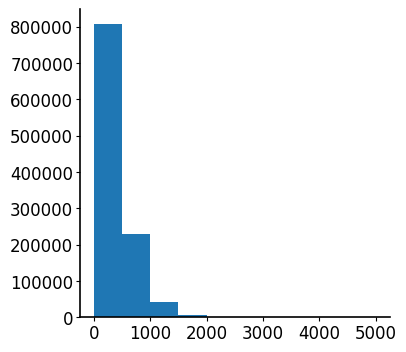

In [35]:
vizgen.obs['n_transcripts'] = vizgen.X.sum(1)
plt.hist(vizgen.obs['n_transcripts'], range=[0, 5000])

In [36]:
vizgen.X = csr(vizgen.X)

In [37]:
vizgen.write_h5ad('vizgen_liver_cancer_cellpose_triplez.h5ad')

### Baysor segmentation

In [7]:
folder = '/external_data/other/Vizgen_redownload'

In [ ]:
import glob
import re

files = glob.glob(f'{folder}/HumanLiverCancerPatient1/cellpose_triple_zlayer/baysor_segmentation/segmentation_m50_fov_*[0-9].csv')
files_dict = {int(re.search('fov_(\d+)', file).group(1)):file for file in files}
print(files_dict.keys())

adata = {}

for key, value in files_dict.items():
    print(key)
    df = pd.read_csv(value)
    df["v"] = np.ones(df.shape[0], int)
    df=df[df['is_noise']==False]
    adata[key] = sc.AnnData(df[['cell', 'gene', 'v']].groupby(['cell', 'gene']).sum().pivot_table('v', index='cell', columns='gene').fillna(0).iloc[1:])
    df = pd.read_csv(f'{folder}/HumanLiverCancerPatient1/cellpose_triple_zlayer/baysor_segmentation/segmentation_m50_fov_' + str(key) + '_cell_stats.csv', index_col='cell')
    indices = np.intersect1d(df.index, adata[key].obs_names.astype(int))
    adata[key] = adata[key][indices.astype(str)]
    adata[key].obs = df.loc[indices]
patient1 = anndata.concat(list(adata.values()), label='fov', keys=list(adata.keys()), join='outer', fill_value=0)

In [16]:
import glob
files = glob.glob(f'{folder}/HumanLiverCancerPatient2/cellpose_triple_zlayer/baysor_segmentation/segmentation_m50_fov_*[0-9].csv')
files_dict = {int(re.search('fov_(\d+)', file).group(1)):file for file in files}

adata = {}

for key, value in files_dict.items():
    print(key)
    df = pd.read_csv(value)
    df["v"] = np.ones(df.shape[0], int)
    df=df[df['is_noise']==False]
    adata[key] = sc.AnnData(df[['cell', 'gene', 'v']].groupby(['cell', 'gene']).sum().pivot_table('v', index='cell', columns='gene').fillna(0).iloc[1:])
    df = pd.read_csv(f'{folder}/HumanLiverCancerPatient2/cellpose_triple_zlayer/baysor_segmentation/segmentation_m50_fov_' + str(key) + '_cell_stats.csv', index_col='cell')
    indices = np.intersect1d(df.index, adata[key].obs_names.astype(int))
    adata[key] = adata[key][indices.astype(str)]
    adata[key].obs = df.loc[indices]
patient2 = anndata.concat(list(adata.values()), label='fov', keys=list(adata.keys()), join='outer', fill_value=0)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [17]:
baysor = patient1.concatenate(patient2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)

/tmp/ipykernel_1162653/3847637059.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  baysor = patient1.concatenate(patient2, batch_key='patient', batch_categories=['patient1', 'patient2'], index_unique=None)


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [18]:
baysor.obsm['spatial'] = baysor.obs[['x', 'y']].values

In [19]:
baysor.X = csr(baysor.X)
baysor.layers['raw_counts'] = baysor.X.copy()

In [20]:
baysor.write_h5ad('vizgen_liver_cancer_baysor.h5ad')

### Proseg nucleus segmentation

We perform cell-typing for this segmentation and then transfer it to other segmentations using a semisupervised resolVI model.

In [7]:
proseg = {}
proseg['HumanLiverCancerPatient2'] = anndata.AnnData(X=pd.read_csv('/external_data/other/Vizgen_redownload/HumanLiverCancerPatient2/cellpose_nuclei/expected-counts.csv.gz'))
proseg['HumanLiverCancerPatient2'].X = csr(proseg['HumanLiverCancerPatient2'].X)
proseg['HumanLiverCancerPatient1'] = anndata.AnnData(X=pd.read_csv('/external_data/other/Vizgen_redownload/HumanLiverCancerPatient1/cellpose_nuclei/expected-counts.csv.gz'))
proseg['HumanLiverCancerPatient1'].X = csr(proseg['HumanLiverCancerPatient1'].X)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [8]:
for i in proseg:
    cell_meta = pd.read_csv(f'/external_data/other/Vizgen_redownload/{i}/cellpose_nuclei/transcript-metadata.csv.gz')
    cell_meta = cell_meta # [cell_meta['background']==0]
    cell_avg = cell_meta.groupby('assignment').mean()
    cell_avg = cell_avg.loc[proseg[i].obs.index.astype(int).intersection(cell_avg.index)]
    cell_avg.index = [str(i) for i in cell_avg.index]
    proseg[i] = proseg[i][cell_avg.index]
    proseg[i].obs = cell_avg
    cell_meta['v'] = np.ones(cell_meta.shape[0], int)
    counts = cell_meta[['assignment', 'gene', 'v']].groupby(['assignment', 'gene']).sum().pivot_table('v', index='assignment', columns='gene').fillna(0)
    proseg[i].layers['counts'] = csr(counts.loc[proseg[i].obs_names.astype(int), proseg[i].var_names].values)
    counts_wo_bg = cell_meta.loc[cell_meta['background']==0, ['assignment', 'gene', 'v']].groupby(['assignment', 'gene']).sum().pivot_table('v', index='assignment', columns='gene').fillna(0)
    counts_sub = 0 * counts
    counts_sub.loc[counts_wo_bg.index] = counts_wo_bg
    proseg[i].layers['counts_wo_bg'] = csr(counts_sub.loc[proseg[i].obs_names.astype(int), proseg[i].var_names].values)
    del cell_meta, cell_avg, counts, counts_wo_bg, counts_sub

/tmp/ipykernel_1629984/4135563646.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cell_avg = cell_meta.groupby('assignment').mean()
/tmp/ipykernel_1629984/4135563646.py:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cell_avg = cell_meta.groupby('assignment').mean()


In [9]:
import anndata

for key, adata in proseg.items():
    adata.obs['patient'] = key

proseg_concat = anndata.concat(proseg.values(), join='outer')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [10]:
proseg_concat.layers['estimated'] = proseg_concat.X.copy()

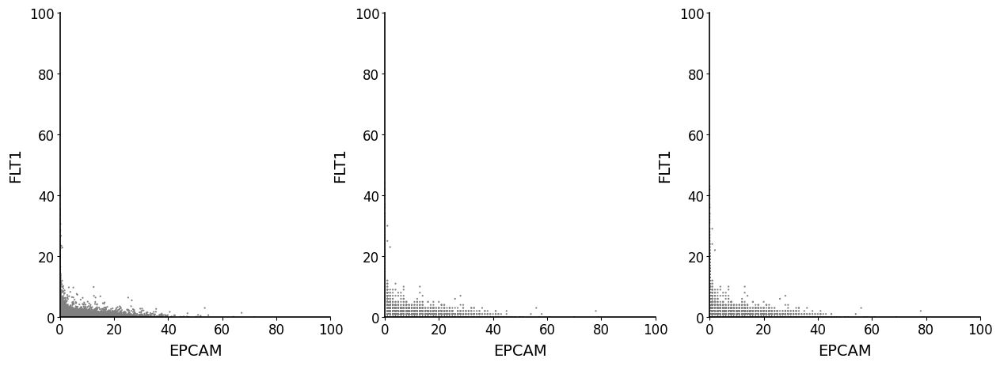

In [11]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
sc.pl.scatter(proseg_concat, x='EPCAM', y='FLT1', layers='estimated', ax=ax[0], show=False, size=10)
sc.pl.scatter(proseg_concat, x='EPCAM', y='FLT1', layers='counts', ax=ax[1], show=False, size=10)
sc.pl.scatter(proseg_concat, x='EPCAM', y='FLT1', layers='counts_wo_bg', ax=ax[2], show=False, size=10)
# Set the limits
x_limits = [0, 100]
y_limits = [0, 100]

for a in ax:
    a.set_xlim(x_limits)
    a.set_ylim(y_limits)

In [12]:
proseg_concat.obsm['spatial'] = proseg_concat.obsm['X_spatial'] = proseg_concat.obs[['x', 'y']].values

In [13]:
proseg_concat.write_h5ad('vizgen_liver_cancer_proseg_nuclei.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 5) with CUDA driver version (12, 4) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 4) to continue using cuDF.
  warnings.warn(


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


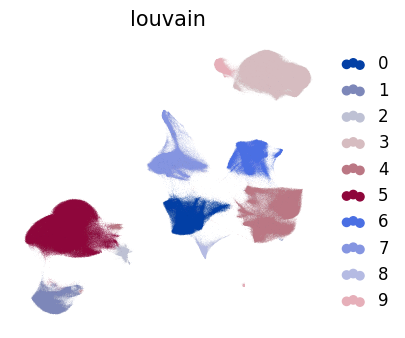

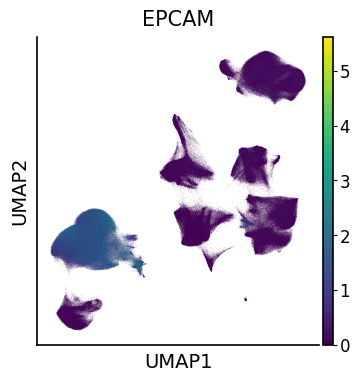

In [6]:
try:
    _utils.compute_umap_embedding(proseg_concat, representation_key="estimated", show=True, key='estimated', n_neighbors=30)
except:
    sc.pl.umap(proseg_concat, color='EPCAM')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


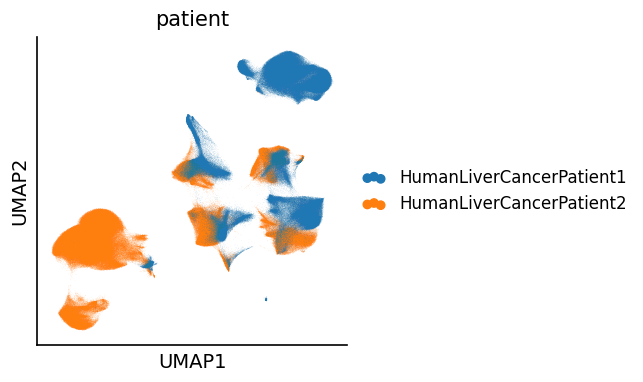

In [7]:
sc.pl.umap(proseg_concat, color='patient')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


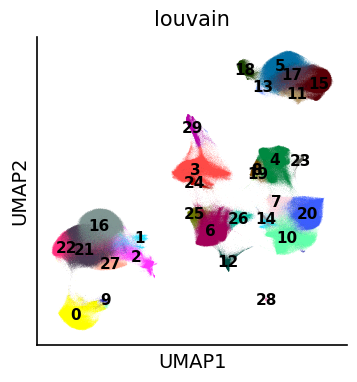

In [8]:
sc.tl.louvain(proseg_concat, resolution=1.3, flavor='rapids')
sc.pl.umap(proseg_concat, color='louvain', legend_loc='on data')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


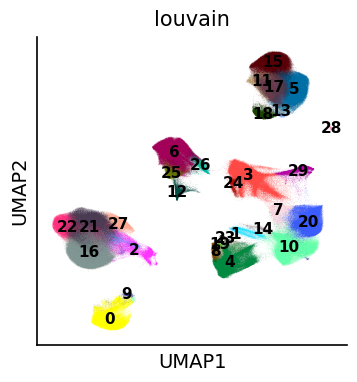

In [19]:
sc.tl.louvain(proseg_concat, resolution=1.3, flavor='rapids')
sc.pl.umap(proseg_concat, color='louvain', legend_loc='on data')

In [ ]:
sc.tl.rank_genes_groups(proseg_concat, groupby='louvain')
sc.pl.rank_genes_groups_dotplot(proseg_concat)

In [11]:
proseg_concat.obsm['X_spatial'] = proseg_concat.obsm['X_spatial']

In [12]:
for i in proseg_concat.obs['louvain'].unique():
    sub = sc.get.rank_genes_groups_df(proseg_concat, i).head(20)
    print('cluster', i, ':        ', ', '.join(sub['names']))

cluster 16 :         CDH1, VTN, PROX1, EPCAM, SERPINA1, ERBB3, YAP1, BCL2L1, PTK2, XBP1, CCND1, FGFR3, PRKCA, EPHB4, MET, IDH1, VEGFA, FGFR2, SHARPIN, SMO
cluster 21 :         SERPINA1, EPCAM, CDH1, TGFBI, XBP1, PROX1, FGFR3, VTN, SOX9, CCND1, TBX3, EPHB4, IDH1, VEGFA, PRKCA, MET, ERBB3, IL22, YAP1, PRF1
cluster 27 :         EPCAM, SERPINA1, CDH1, MYBL2, FOXM1, EZH2, PROX1, YAP1, CDK4, PCNA, MCM2, MKI67, FGFR3, PRKCA, CDK2, CCND1, EPHB4, BIRC5, MSH2, PTK2
cluster 22 :         SERPINA1, CDH1, VTN, EPCAM, XBP1, GPX3, CXCL2, ESCO2, TGFBI, HAVCR2, CDKN1A, CR2, SOX9, LYZ, CD8B, ICOSLG, PROX1, FN1, CCND1, CD160
cluster 0 :         SERPINA1, VTN, ARG1, ATF3, CD14, CD8B, CXCL2, EGR1, CDH1, FN1, PROX1, SERPINE1, XBP1, PRF1, DES, RORC, CCND1, ESCO2, VEGFA, FOS
cluster 6 :         ETS1, TRAC, CXCR4, CD3E, ZAP70, CD2, ITGB2, HLA-B, PTPRC, CD5, JAK1, CD3D, GATA3, CDKN1B, BCL2, IL2RB, ITK, HLA-C, ICAM3, CD28
cluster 8 :         PLVAP, KDR, PECAM1, CTNNB1, ETS1, CDH5, TGFBR2, MMRN2, ENG, EPHB4, COL4A

In [13]:
cell_type_mapping = {
    '0': 'Cancer cell Immune Doublet',
    '1': 'Cancer cells Fibroblast Doublet',
    '2': 'Cancer cells SOX9',
    '3': 'Macrophage MHCII',
    '4': 'Endothelial cells',
    '5': 'Cancer cells SERPINA',
    '6': 'T cells',
    '7': 'Fibroblast',
    '8': 'Endothelial cells',
    '9': 'Cancer cells RORC',
    '10': 'Myofibroblasts',
    '11': 'Cancer cells SOX9',
    '12': 'Plasma cells',
    '13': 'Cancer cell SERPINA',
    '14': 'Myofibroblasts',
    '15': 'Cancer cells RORC',
    '16': 'Cancer cells SERPINA',
    '17': 'Cancer cells SERPINA',
    '18': 'Cancer cells SERPINA',
    '19': 'Endothelial cells',
    '20': 'Myofibroblasts',
    '21': 'Cancer cells SERPINA',
    '22': 'Cancer cells  SERPINA',
    '23': 'Endothelial cells',
    '24': 'Macrophage II',
    '25': 'B cells',
    '26': 'Fibroblast+Tcell',
    '27': 'Cancer cells SERPINA',
    '28': 'Cancer cells Macrophage Doublet',
    '29': 'Macrophage suppressive',
}
proseg_concat.obs['louvain_final'] = proseg_concat.obs['louvain']
proseg_concat.obs['cell_type'] = proseg_concat.obs['louvain_final'].astype(str).map(cell_type_mapping)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


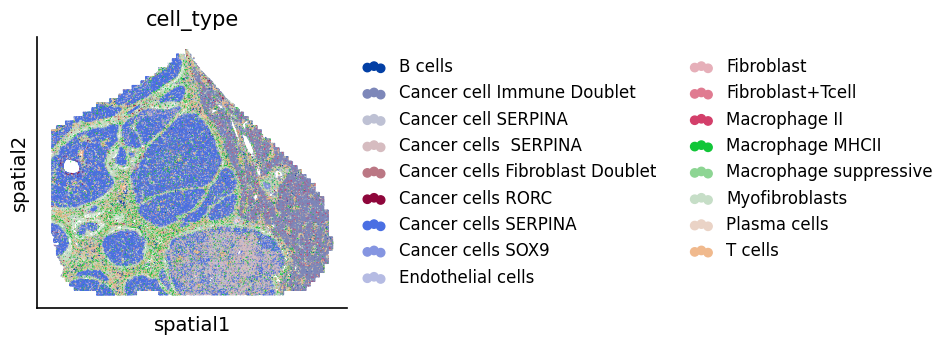

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


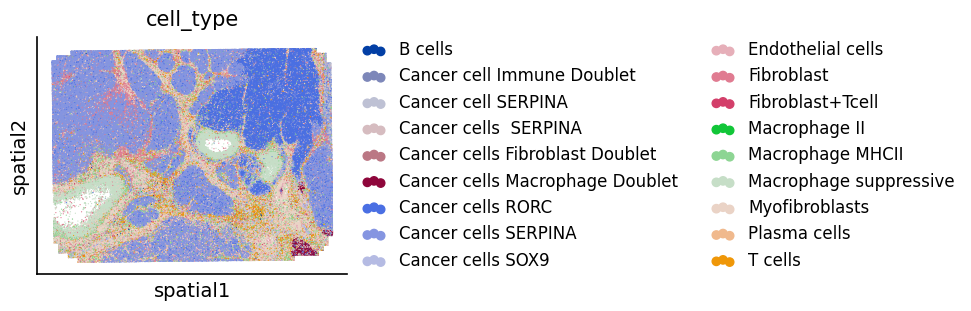

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


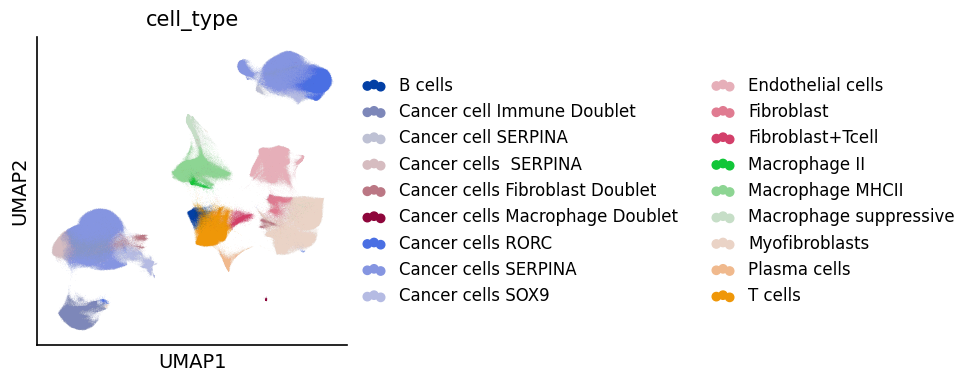

In [14]:
sc.pl.spatial(proseg_concat[proseg_concat.obs['patient']=='HumanLiverCancerPatient2'], color='cell_type', spot_size=50, sort_order=False)
sc.pl.spatial(proseg_concat[proseg_concat.obs['patient']=='HumanLiverCancerPatient1'], color='cell_type', spot_size=50, sort_order=False)
sc.pl.umap(proseg_concat, color='cell_type', sort_order=False)

In [23]:
coarse_cell_type_mapping = {
    '0': 'unassigned',
    '1': 'unassigned',
    '2': 'Cancer cells',
    '3': 'Macrophage',
    '4': 'Endothelial cells',
    '5': 'Cancer cells',
    '6': 'T cells',
    '7': 'unassigned',
    '8': 'Endothelial cells',
    '9': 'Cancer cells',
    '10': 'Myofibroblasts',
    '11': 'Cancer cells',
    '12': 'Plasma cells',
    '13': 'Cancer cells',
    '14': 'Myofibroblasts',
    '15': 'Cancer cells',
    '16': 'Cancer cells',
    '17': 'Cancer cells',
    '18': 'Cancer cells',
    '19': 'Endothelial cells',
    '20': 'Myofibroblasts',
    '21': 'Cancer cells',
    '22': 'Cancer cells',
    '23': 'Endothelial cells',
    '24': 'Macrophage',
    '25': 'B cells',
    '26': 'unassigned',
    '27': 'Cancer cells',
    '28': 'unassigned',
    '29': 'Macrophage',
}
proseg_concat.obs['cell_type_coarse'] = proseg_concat.obs['louvain_final'].astype(str).map(coarse_cell_type_mapping)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


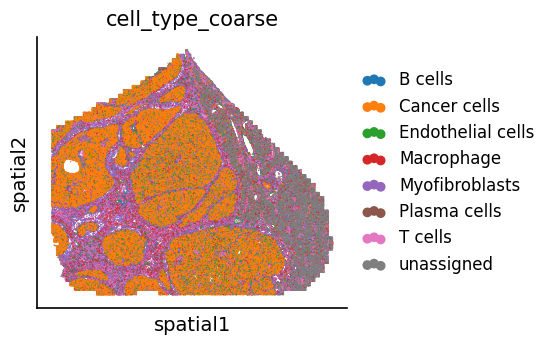

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


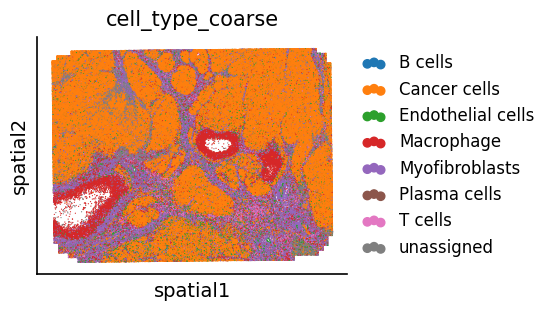

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


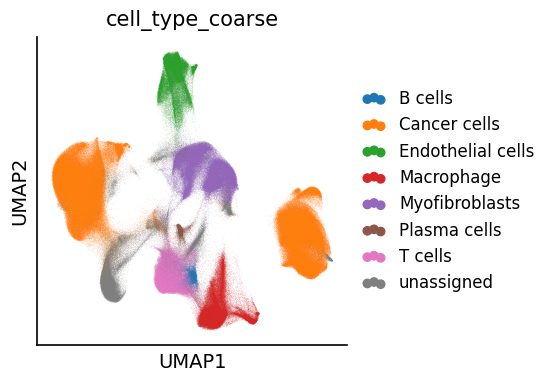

In [24]:
sc.pl.spatial(proseg_concat[proseg_concat.obs['patient']=='HumanLiverCancerPatient2'], color='cell_type_coarse', spot_size=50, sort_order=False)
sc.pl.spatial(proseg_concat[proseg_concat.obs['patient']=='HumanLiverCancerPatient1'], color='cell_type_coarse', spot_size=50, sort_order=False)
sc.pl.umap(proseg_concat, color='cell_type_coarse', sort_order=False)

In [17]:
sc.pp.filter_cells(proseg_concat, min_counts=5)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [10]:
proseg_concat.write('vizgen_liver_cancer_proseg_nuclei_processed.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


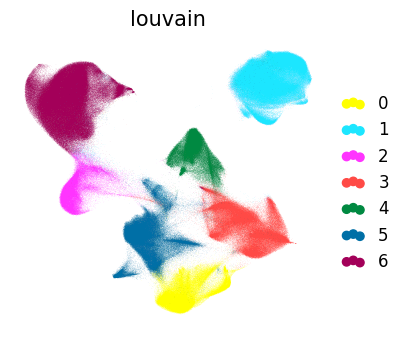

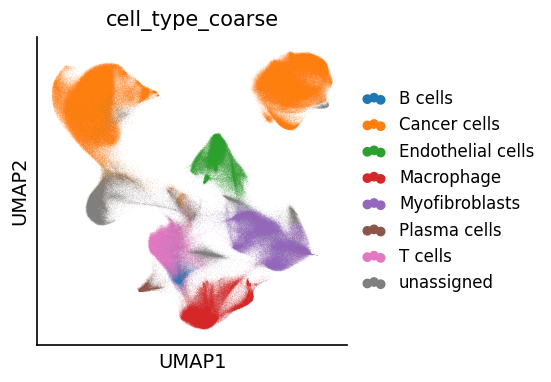

In [26]:
try:
    _utils.compute_umap_embedding(proseg_concat, representation_key="counts_wo_bg", show=True, key='estimated', n_neighbors=30)
except:
    sc.pl.umap(proseg_concat, color='cell_type_coarse')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


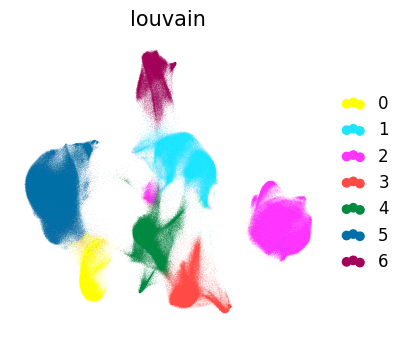

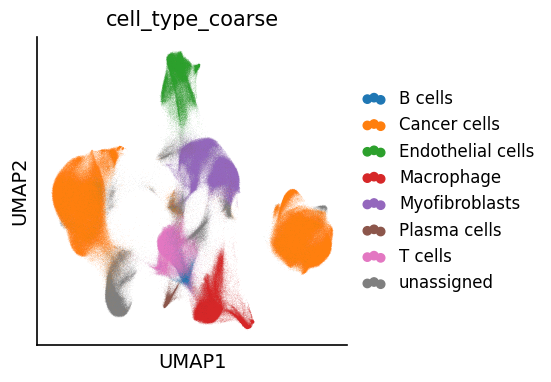

In [27]:
try:
    _utils.compute_umap_embedding(proseg_concat, representation_key="counts", show=True, key='estimated', n_neighbors=30)
except:
    sc.pl.umap(proseg_concat, color='cell_type_coarse')

In [8]:
cell_type_mapping = {
    '0': 'unassigned',
    '1': 'unassigned',
    '2': 'Cancer cells',
    '3': 'Macrophage MHCII',
    '4': 'Endothelial cells',
    '5': 'Cancer cells',
    '6': 'T cells',
    '7': 'Fibroblast',
    '8': 'Endothelial cells',
    '9': 'Cancer cells',
    '10': 'Myofibroblasts',
    '11': 'Cancer cells',
    '12': 'Plasma cells',
    '13': 'Cancer cells',
    '14': 'Myofibroblasts',
    '15': 'Cancer cells',
    '16': 'Cancer cells',
    '17': 'Cancer cells',
    '18': 'Cancer cells',
    '19': 'Endothelial cells',
    '20': 'Myofibroblasts',
    '21': 'Cancer cells',
    '22': 'Cancer cells',
    '23': 'Endothelial cells',
    '24': 'Macrophage MHCII',
    '25': 'B cells',
    '26': 'unassigned',
    '27': 'Cancer cells',
    '28': 'unassigned',
    '29': 'Macrophage suppressive',
}
proseg_concat.obs['cell_type_filtered'] = proseg_concat.obs['louvain_final'].astype(str).map(cell_type_mapping)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


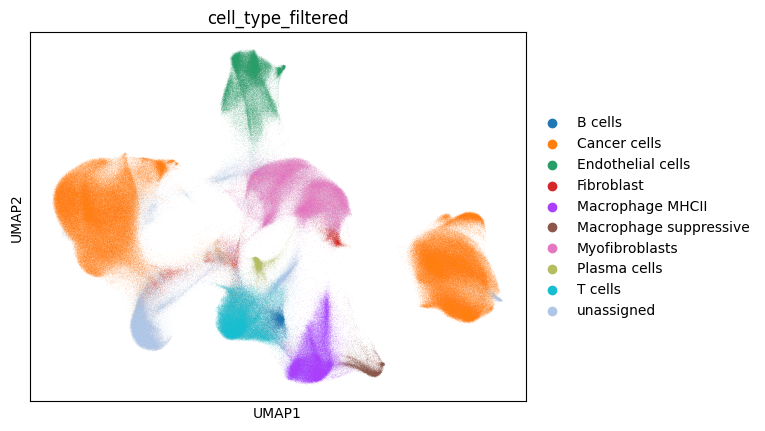

In [9]:
sc.pl.umap(proseg_concat, color='cell_type_filtered')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


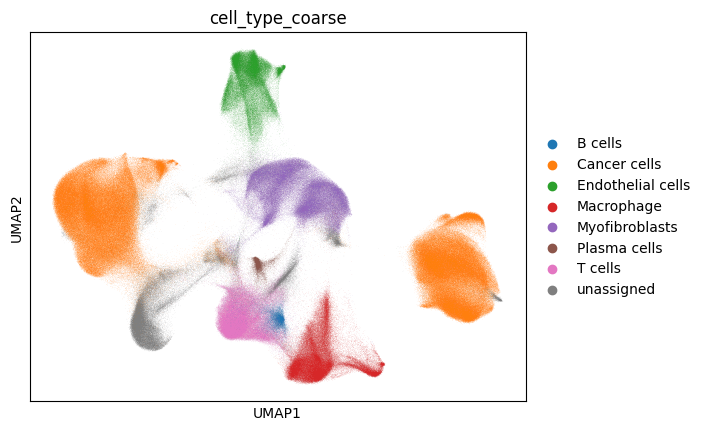

In [5]:
sc.pl.umap(proseg_concat, color='cell_type_coarse')

## Downstream

### Original

In [6]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisupervised_fine_redo_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 5) with CUDA driver version (12, 4) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 4) to continue using cuDF.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For cre

Epoch 1/50:   2%|▏         | 1/50 [00:00<00:19,  2.54it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:19,  2.46it/s, v_num=1]


In [7]:
proseg = sc.read_h5ad('vizgen_liver_cancer_original.h5ad')

In [8]:
proseg.layers['raw_counts'] = proseg.X.copy()

In [9]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            
INFO     Found 100.0% reference vars in query data.                                                                


In [10]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 1043842 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category unassigned.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:16,  2.99it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:17,  2.88it/s, v_num=1]


In [11]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=10000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   0%|          | 0/23 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 23/23 [30:56<00:00, 80.70s/it] 


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


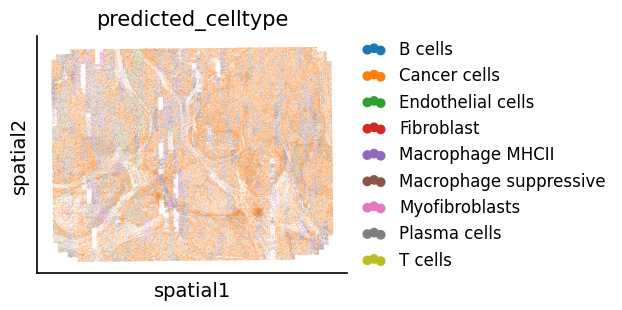

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


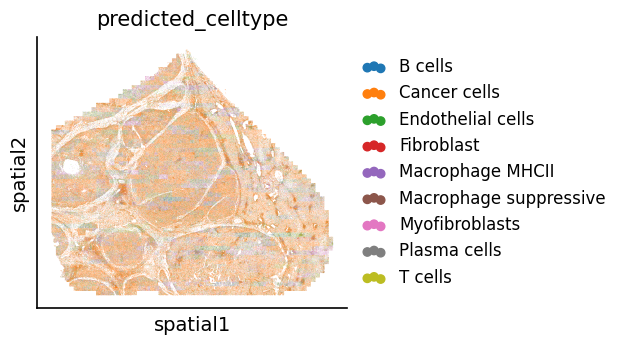

In [12]:
sc.pl.spatial(proseg[proseg.obs['patient']=='patient1'], color='predicted_celltype', spot_size=10., alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='patient2'], color='predicted_celltype', spot_size=10., alpha=1.0)

In [13]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


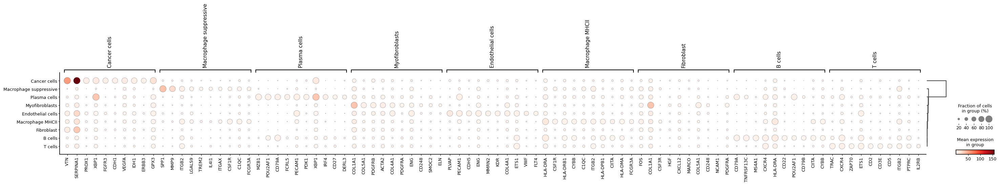

In [14]:
sc.tl.rank_genes_groups(proseg, groupby='predicted_celltype', method='wilcoxon', n_genes=10)
sc.pl.rank_genes_groups_dotplot(proseg, n_genes=10, groupby='predicted_celltype')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


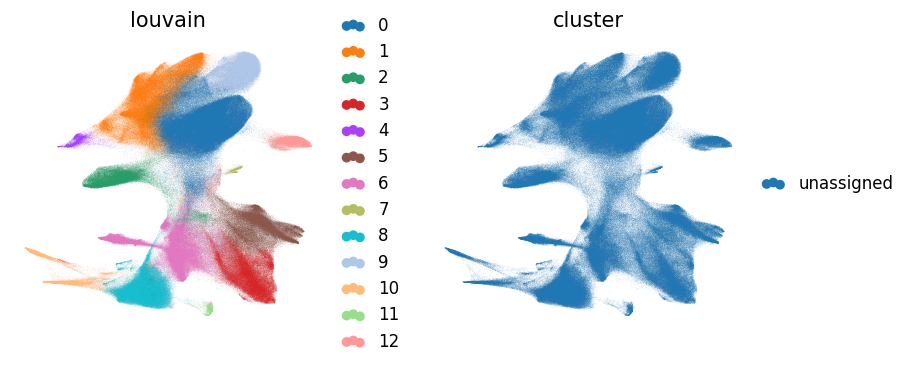

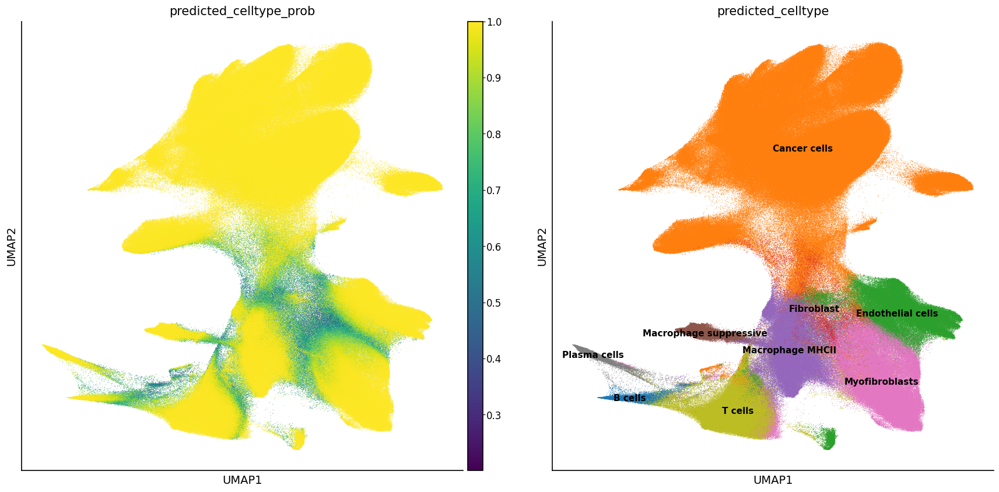

In [16]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


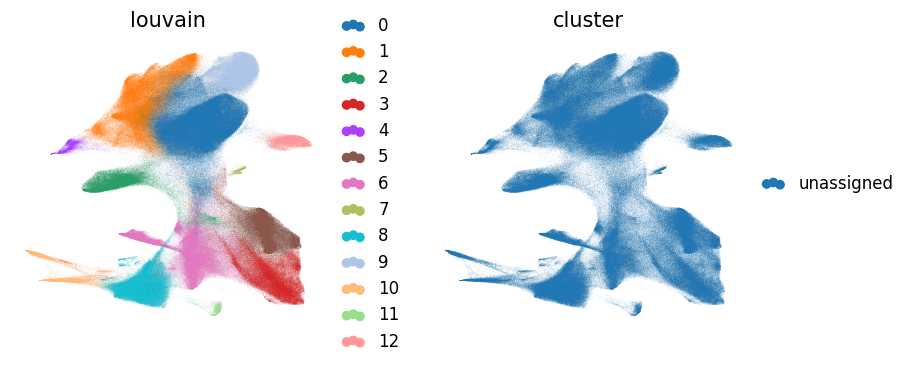

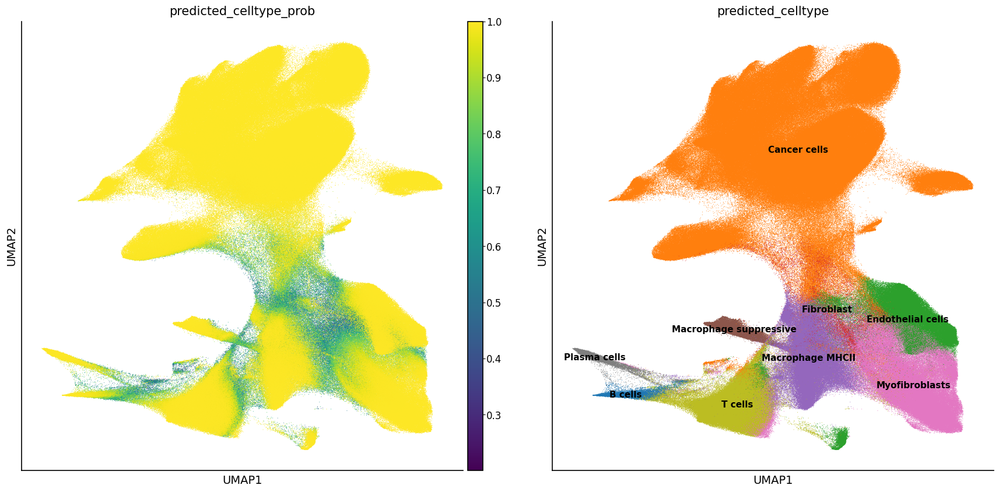

In [17]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [18]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   0%|          | 0/38 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Sampling macro-batches, batch: 100%|██████████| 38/38 [14:57<00:00, 23.63s/it]


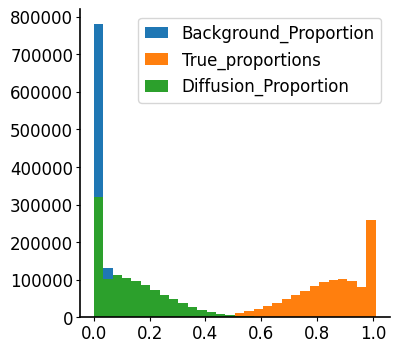

In [19]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'original_histogram_proportions.pdf')
plt.show()

In [20]:
proseg.write_h5ad('vizgen_liver_cancer_original_processed.h5ad')

### Proseg

In [22]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisupervised_fine_redo_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:05,  8.68it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.62it/s, v_num=1]


In [23]:
proseg = sc.read_h5ad('vizgen_liver_cancer_proseg_nuclei_processed.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [24]:
proseg.layers['raw_counts'] = proseg.layers['counts'].copy()

In [25]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


INFO     Found 100.0% reference vars in query data.                                                                


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [26]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
proseg.obs_names_make_unique()
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 1043842 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category unassigned.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:17,  2.78it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:17,  2.73it/s, v_num=1]


In [27]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=10000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   5%|▍         | 1/21 [00:21<07:11, 21.60s/it]

Sampling macro-batches, batch: 100%|██████████| 21/21 [07:34<00:00, 21.64s/it]


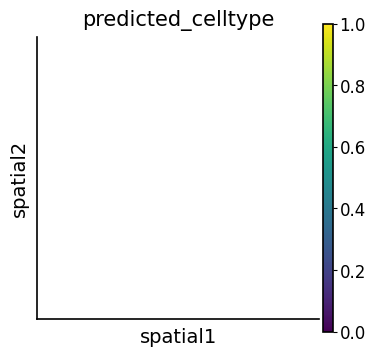

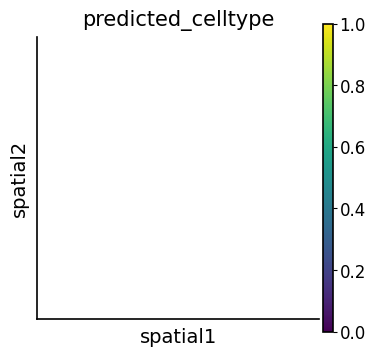

In [28]:
sc.pl.spatial(proseg[proseg.obs['patient']=='patient1'], color='predicted_celltype', spot_size=50., alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='patient2'], color='predicted_celltype', spot_size=50., alpha=1.0)

In [29]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


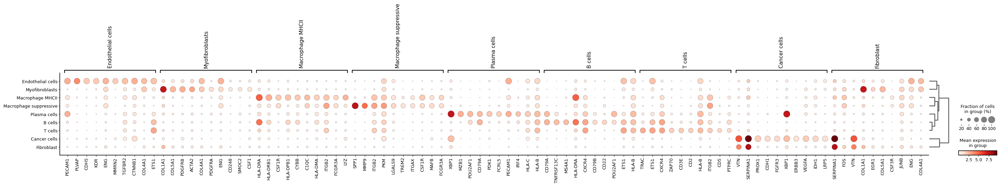

In [30]:
sc.tl.rank_genes_groups(proseg, groupby='predicted_celltype', method='wilcoxon', n_genes=10)
sc.pl.rank_genes_groups_dotplot(proseg, n_genes=10, groupby='predicted_celltype')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


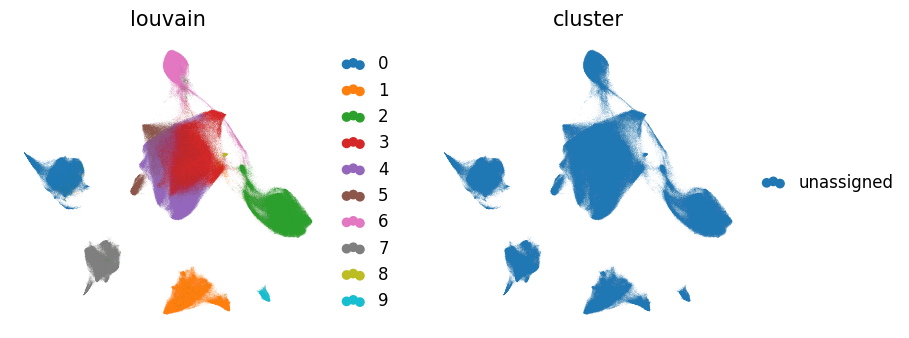

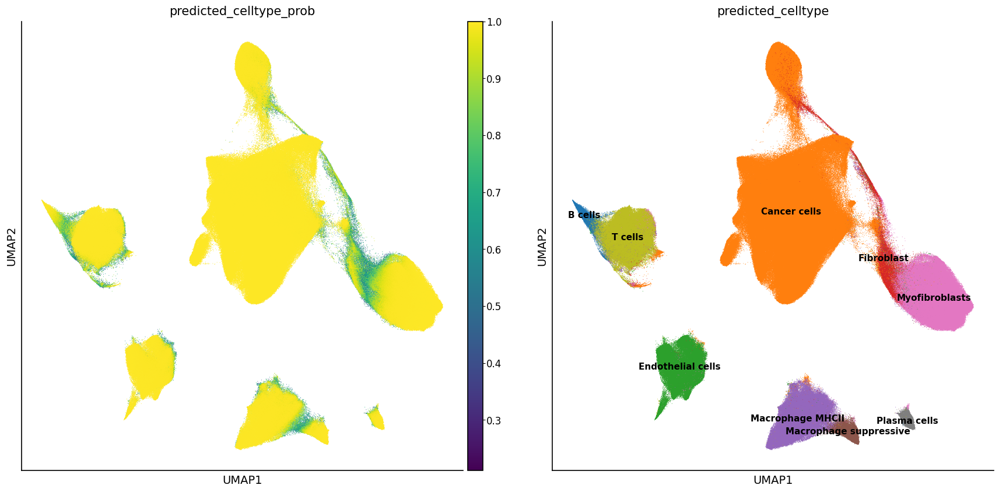

In [31]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [32]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   3%|▎         | 1/35 [00:13<07:43, 13.64s/it]

Sampling macro-batches, batch: 100%|██████████| 35/35 [07:49<00:00, 13.42s/it]


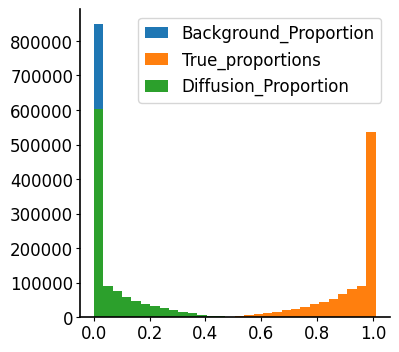

In [33]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'proseg_histogram_proportions.pdf')
plt.show()

In [34]:
proseg.write_h5ad('vizgen_liver_cancer_proseg_nuclei_processed_new.h5ad')

### Cellpose nuclei

In [35]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisupervised_fine_redo_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:09,  4.98it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:10,  4.84it/s, v_num=1]


In [36]:
proseg = sc.read_h5ad('vizgen_liver_cancer_cellpose_nuclei.h5ad')

In [37]:
proseg.layers['raw_counts'] = proseg.X.copy()

In [38]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            
INFO     Found 100.0% reference vars in query data.                                                                


In [39]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
proseg.obs_names_make_unique()
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 1043842 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category unassigned.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:06,  7.84it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:06,  7.59it/s, v_num=1]


In [40]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=10000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:  10%|█         | 2/20 [00:36<05:27, 18.22s/it]

Sampling macro-batches, batch: 100%|██████████| 20/20 [06:02<00:00, 18.12s/it]


In [41]:
proseg.obs['patient'].value_counts()

patient2    552098
patient1    413895
Name: patient, dtype: int64

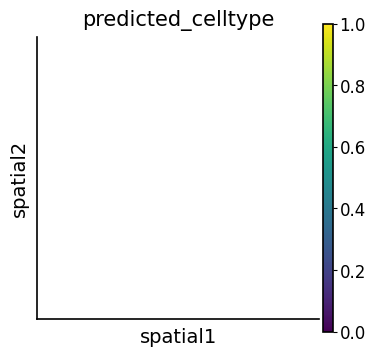

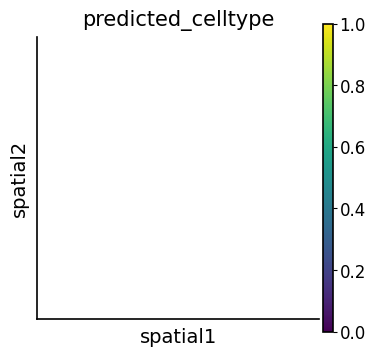

In [42]:
sc.pl.spatial(proseg[proseg.obs['patient']=='HumanLiverCancerPatient1'], color='predicted_celltype', spot_size=10., alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='HumanLiverCancerPatient2'], color='predicted_celltype', spot_size=10., alpha=1.0)

In [43]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

In [47]:
proseg.X.data = proseg.X.data.astype(np.float32)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


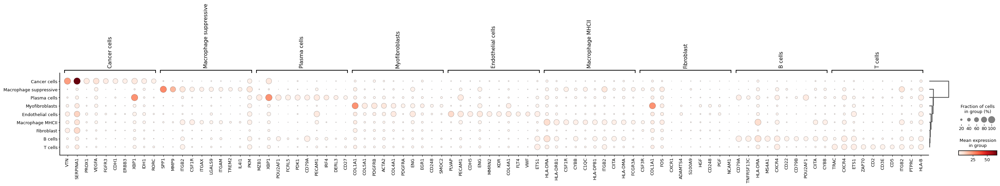

In [48]:
#sc.tl.rank_genes_groups(proseg, groupby='predicted_celltype', method='wilcoxon', n_genes=10)
sc.pl.rank_genes_groups_dotplot(proseg, n_genes=10, groupby='predicted_celltype')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


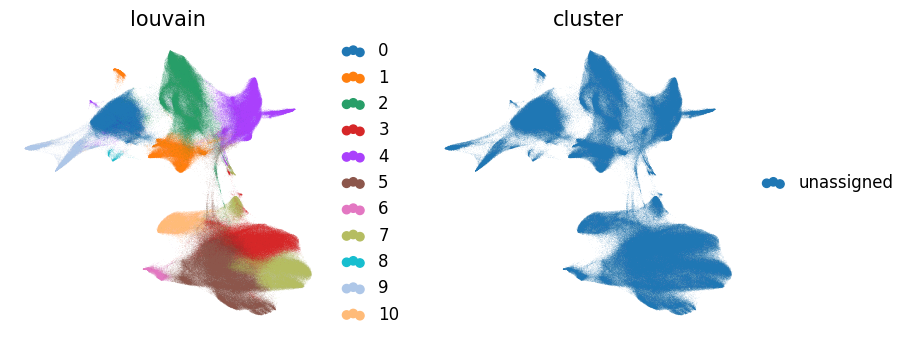

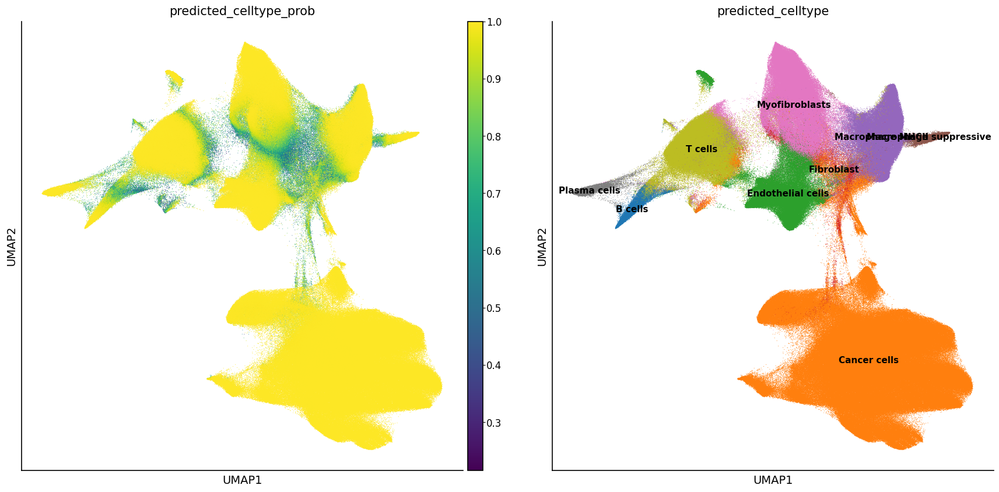

In [49]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [50]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   0%|          | 0/33 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 33/33 [06:41<00:00, 12.16s/it]


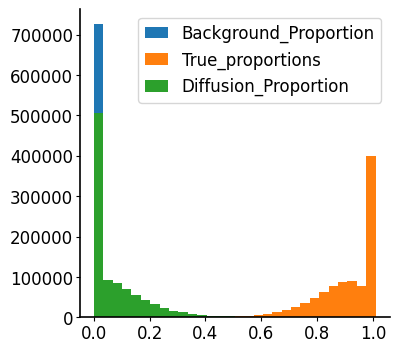

In [51]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'cellpose_nuclei_histogram_proportions.pdf')
plt.show()

In [52]:
proseg.write_h5ad('vizgen_liver_cancer_cellpose_nuclei_processed.h5ad')

### Cellpose single z

In [53]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisupervised_fine_redo_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.87it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.67it/s, v_num=1]


In [54]:
proseg = sc.read_h5ad('vizgen_liver_cancer_cellpose_singlez.h5ad')

In [55]:
proseg.layers['raw_counts'] = proseg.X.copy()

In [56]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            
INFO     Found 100.0% reference vars in query data.                                                                


In [57]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
proseg.obs_names_make_unique()
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 1043842 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category unassigned.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:05,  8.48it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:06,  7.96it/s, v_num=1]


In [58]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=10000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   0%|          | 0/20 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 20/20 [09:37<00:00, 28.89s/it]


In [59]:
proseg.obs['patient'].value_counts()

patient2    530826
patient1    439218
Name: patient, dtype: int64

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


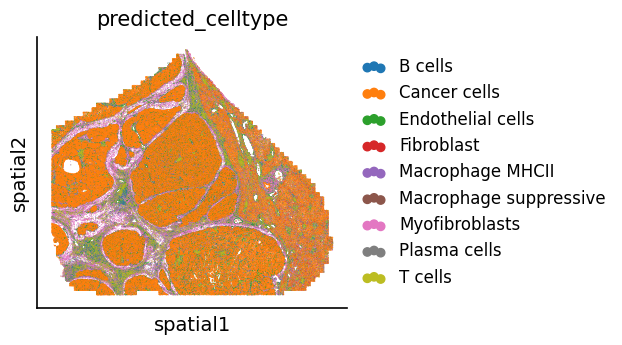

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


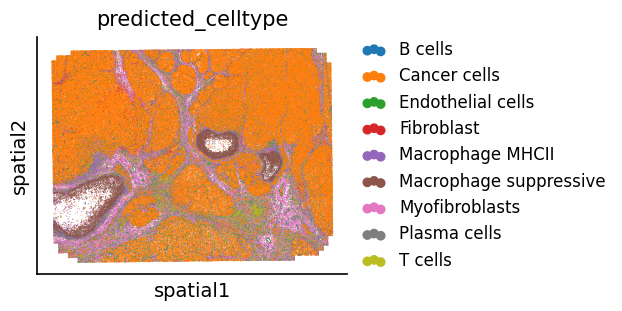

In [60]:
sc.pl.spatial(proseg[proseg.obs['patient']=='patient2'], color='predicted_celltype', spot_size=30., alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='patient1'], color='predicted_celltype', spot_size=30., alpha=1.0)

In [61]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


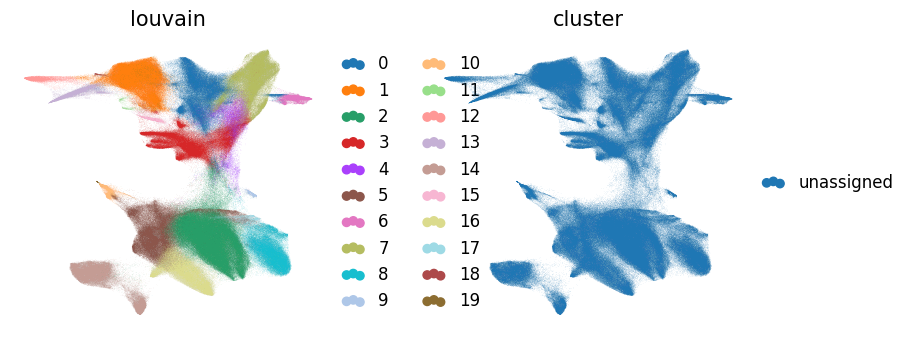

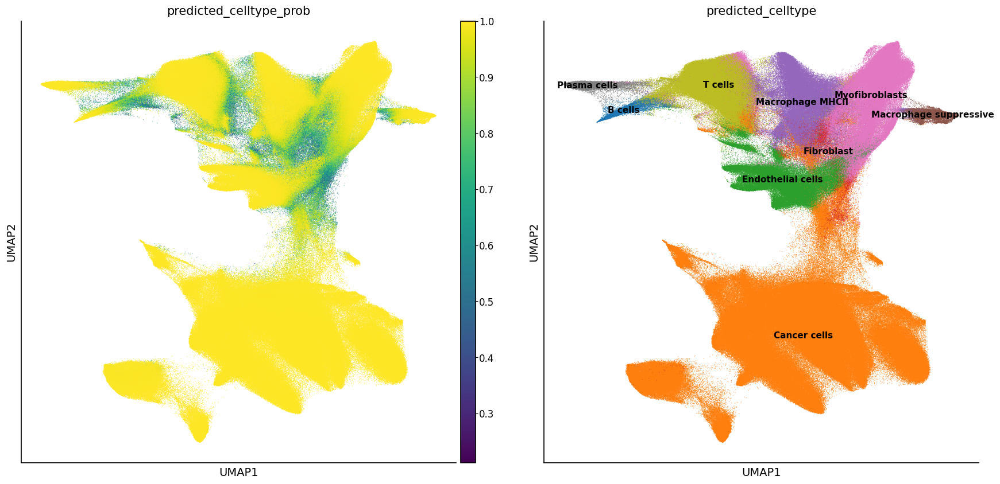

In [62]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [63]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   0%|          | 0/33 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 33/33 [07:24<00:00, 13.47s/it]


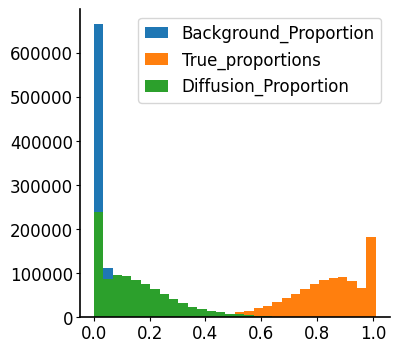

In [64]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'cellpose_singlez_histogram_proportions.pdf')
plt.show()

In [65]:
proseg.write_h5ad('vizgen_liver_cancer_cellpose_singlez_processed.h5ad')

### Cellpose triple z

In [66]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisupervised_fine_redo_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:09,  5.00it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:10,  4.90it/s, v_num=1]


In [67]:
proseg = sc.read_h5ad('vizgen_liver_cancer_cellpose_triplez.h5ad')

In [68]:
proseg.layers['raw_counts'] = proseg.X.copy()

In [69]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            
INFO     Found 100.0% reference vars in query data.                                                                


In [70]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
proseg.obs_names_make_unique()
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 1043842 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category unassigned.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:08,  5.58it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:09,  5.43it/s, v_num=1]


In [71]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=10000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:  10%|▉         | 2/21 [00:39<06:10, 19.51s/it]

Sampling macro-batches, batch: 100%|██████████| 21/21 [06:44<00:00, 19.27s/it]


In [72]:
proseg.obs.iloc[0]

fov                                                                 NaN
volume                                                      1303.341932
center_x                                                     770.304531
center_y                                                      -4.497496
min_x                                                        760.185218
min_y                                                        -11.980963
max_x                                                        776.482287
max_y                                                          4.696463
anisotropy                                                     1.347466
transcript_count                                                     99
perimeter_area_ratio                                           0.343754
solidity                                                        0.97138
patient                                                        patient1
n_transcripts                                                   

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


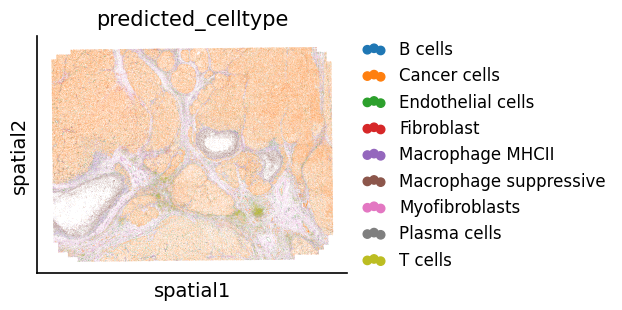

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


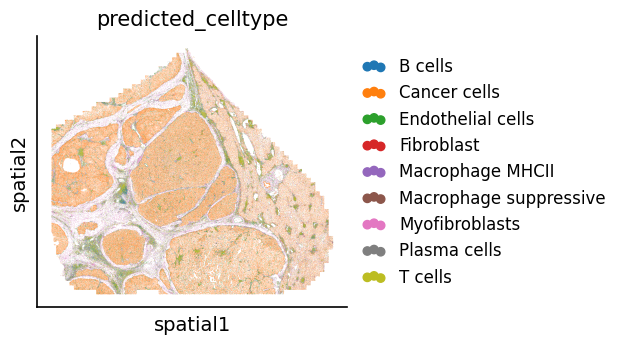

In [73]:
sc.pl.spatial(proseg[proseg.obs['patient']=='patient1'], color='predicted_celltype', spot_size=10., alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='patient2'], color='predicted_celltype', spot_size=10., alpha=1.0)

In [74]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


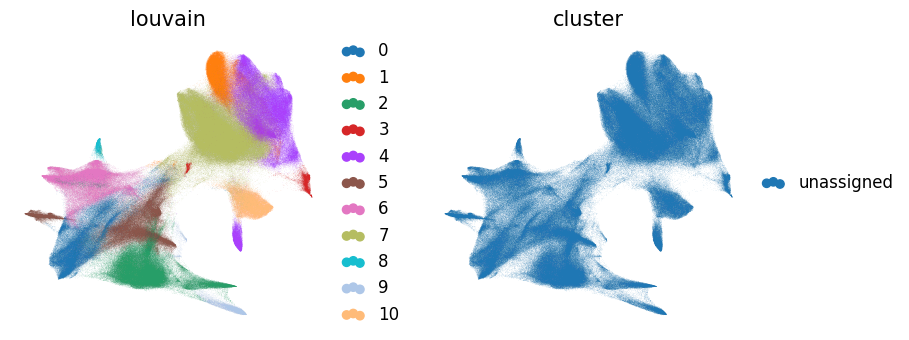

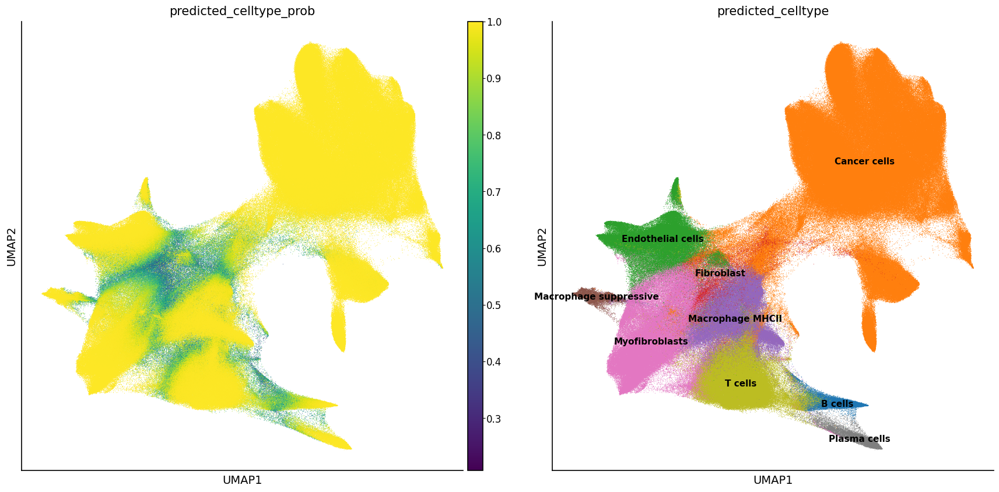

In [75]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [76]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   6%|▌         | 2/34 [00:25<06:50, 12.84s/it]

Sampling macro-batches, batch: 100%|██████████| 34/34 [07:21<00:00, 12.97s/it]


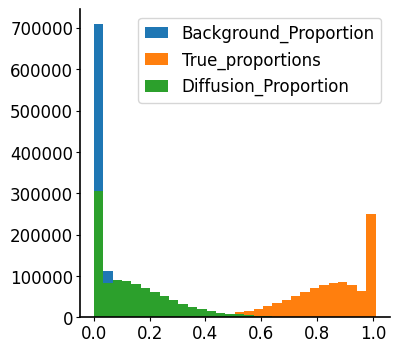

In [77]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'cellpose_triplez_histogram_proportions.pdf')
plt.show()

In [78]:
proseg.write_h5ad('vizgen_liver_cancer_cellpose_triplez_processed.h5ad')

### Baysor

In [79]:
model_path = '/home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisupervised_fine_redo_newest/resolvae'
resolvi_semisupervised = RESOLVI.load(model_path)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 0 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.54it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.29it/s, v_num=1]


In [80]:
proseg = sc.read_h5ad('vizgen_liver_cancer_baysor.h5ad')

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [81]:
proseg.layers['raw_counts'] = proseg.X.copy()

In [82]:
RESOLVI.prepare_query_anndata(proseg, model_path)
proseg = proseg[proseg.layers['raw_counts'].sum(1)>5].copy()

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            
INFO     Found 100.0% reference vars in query data.                                                                


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1897: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [83]:
proseg.obs

,x,y,cluster,n_transcripts,density,elongation,area,avg_confidence,fov,patient
cell,,,,,,,,,,
2,1779.430931,5008.320947,4,131,1.3990,3.230,93.670,0.6933,39,patient1
3,1798.254679,4998.555796,4,24,2.7000,2.672,8.890,0.6301,39,patient1
4,1779.438693,5019.402153,4,89,1.2790,2.315,69.560,0.5699,39,patient1
5,1809.823505,4996.931986,2,22,2.6130,25.350,8.421,0.4773,39,patient1
6,1803.055389,5011.013367,2,18,2.2620,2.000,7.957,0.4389,39,patient1
...,...,...,...,...,...,...,...,...,...,...
4607,4212.879500,4354.556214,2,14,1.3170,3.423,10.630,0.9662,56,patient2
4611,4353.268467,4370.296017,3,6,4.1210,2.355,1.456,1.0000,56,patient2
4614,4784.556878,4228.125278,2,9,6.1940,2.949,1.453,1.0000,56,patient2


In [84]:
proseg.obs = proseg.obs.rename(columns={'cluster': 'baysor_cluster'})

In [85]:
proseg.obs_names = ['query_' + i for i in proseg.obs_names]
proseg.obs_names_make_unique()
resolvi_transfer = RESOLVI.load_query_data(
    proseg,
    model_path,
)

INFO     File                                                                                                      
         /home/cane/Documents/yoseflab/can/resolvi_eval_final2/liver_cancer_vizgen/proseg_newest_bg_high_q25_semisu
         pervised_fine_redo_newest/resolvae/model.pt already downloaded                                            


/home/cane/Documents/yoseflab/can/resolVI/scvi/data/fields/_dataframe_field.py:226: UserWarning: Category 1043842 in adata.obs['_scvi_ind_x'] has fewer than 3 cells. Models may not train properly.
  new_mapping = _make_column_categorical(
/home/cane/Documents/yoseflab/can/resolVI/scvi/data/_manager.py:212: UserWarning: Missing labels key cluster. Filling in with unlabeled category unassigned.
  field_registry[_constants._STATE_REGISTRY_KEY] = field.transfer_field(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/lightning/pytorch/trainer/configuration_validator.py:69: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.75it/s, v_num=1]

`Trainer.fit` stopped: `max_steps=1` reached.


Epoch 1/50:   2%|▏         | 1/50 [00:00<00:07,  6.50it/s, v_num=1]


In [86]:
proseg.obsm['celltype_transfer'] = resolvi_transfer.predict(soft=True, num_samples=3, batch_size=10000)
proseg.obs['predicted_celltype'] = proseg.obsm['celltype_transfer'].idxmax(axis=1)
proseg.obs['predicted_celltype_prob'] = proseg.obsm['celltype_transfer'].max(axis=1)

Sampling macro-batches, batch:   5%|▌         | 2/38 [00:33<10:07, 16.88s/it]

Sampling macro-batches, batch: 100%|██████████| 38/38 [10:33<00:00, 16.67s/it]


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


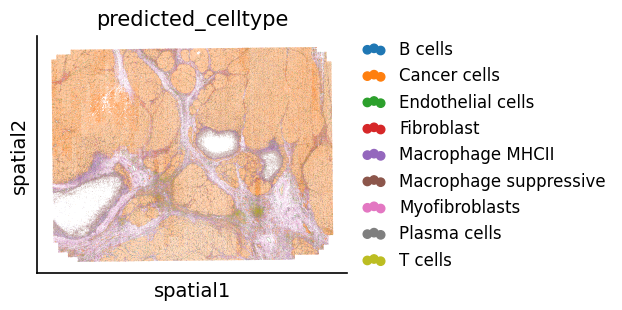

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:1292: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


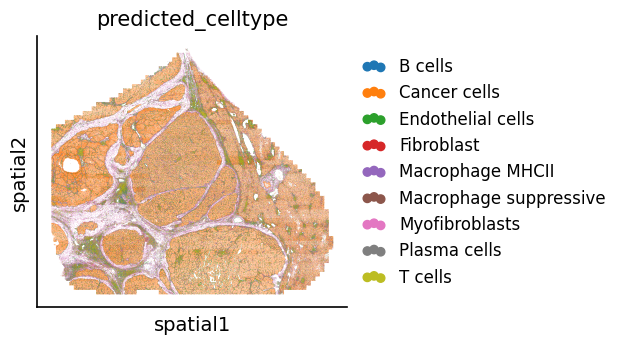

In [87]:
sc.pl.spatial(proseg[proseg.obs['patient']=='patient1'], color='predicted_celltype', spot_size=10., alpha=1.0)
sc.pl.spatial(proseg[proseg.obs['patient']=='patient2'], color='predicted_celltype', spot_size=10., alpha=1.0)

In [88]:
proseg.obsm['X_resolvi'] = resolvi_transfer.get_latent_representation()

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


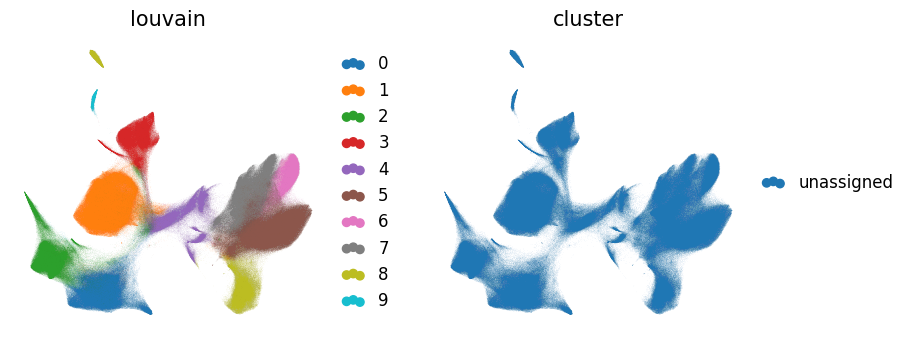

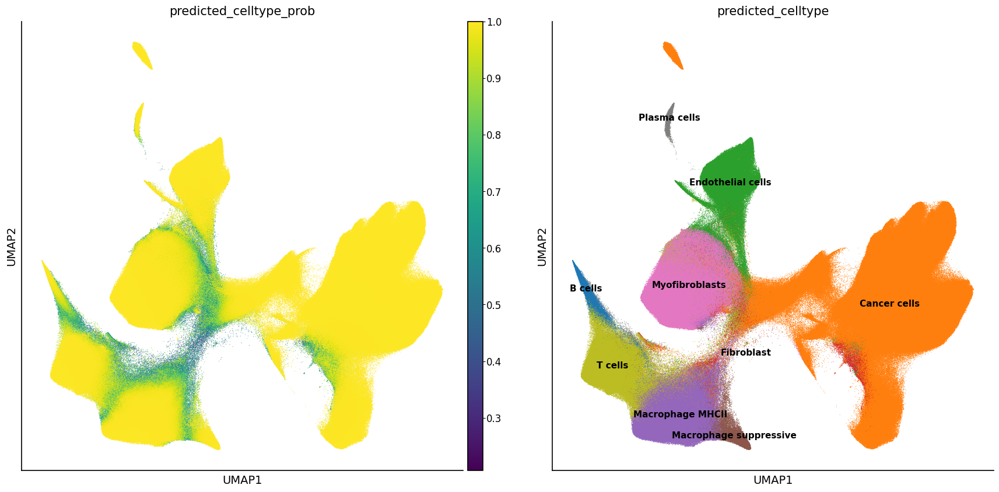

In [89]:
sys.path.append('/home/cane/Documents/yoseflab/can/resolvi_eval_final2')
import _utils
try:
    _utils.compute_umap_embedding(proseg, representation_key="X_resolvi", n_comps=None,
                                  show=True, n_neighbors=20, min_dist_umap=0.2, extra_save='transferred_latent')
except:
    with plt.rc_context({'figure.figsize': (10, 10)}):
        sc.pl.umap(proseg, color=['predicted_celltype_prob', 'predicted_celltype'], legend_loc='on data', size=2)

In [90]:
proseg.obsm['X_umap_transferred'] = proseg.obsm['X_umap']
proseg.obsm['X_resolvi_transferred'] = proseg.obsm['X_resolvi']

Sampling macro-batches, batch:   0%|          | 0/63 [00:00<?, ?it/s]

Sampling macro-batches, batch: 100%|██████████| 63/63 [13:27<00:00, 12.82s/it]


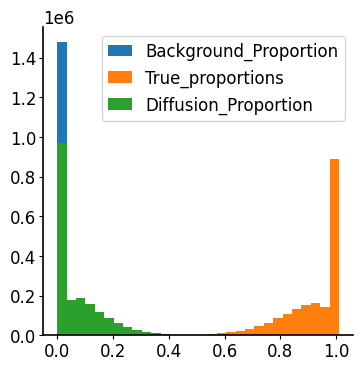

In [91]:
samples = resolvi_transfer.sample_posterior_predictive(
    model=resolvi_transfer.module.model_residuals,
    return_sites=['mixture_proportions'],
    num_samples=3, return_samples=False, batch_size=5000, macro_batch_size=30000)
samples = pd.DataFrame(samples).T

proseg.obs['true_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 0]
proseg.obs['diffusion_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 1]
proseg.obs['background_proportion_transfer'] = samples.loc['post_sample_means', 'mixture_proportions'][:, 2]

_ = plt.hist(proseg.obs['background_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['true_proportion_transfer'], bins=30, range=(0,1.01))
_ = plt.hist(proseg.obs['diffusion_proportion_transfer'], bins=30, range=(0,1.01))
plt.legend(['Background_Proportion', 'True_proportions', 'Diffusion_Proportion'])
plt.savefig(f'baysor_histogram_proportions.pdf')
plt.show()

In [92]:
proseg.write_h5ad('vizgen_liver_cancer_baysor_processed.h5ad')